## Adjectives

In [1]:
import pandas as pd
import numpy as np
import ast
import re
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from wordcloud import WordCloud


In [2]:
df = pd.read_csv("panel_adjectives_extracted.csv")
df.head()


,panelist_id,Q_bouygues_reactions_spontanees_1_adjs,Q_bouygues_memorisation_1_adjs,Q_bouygues_caractere_distinctif_1_adjs,Q_bouygues_attractivite_1_adjs,Q_bouygues_attractivite_2_adjs,Q_bouygues_resonance_emotionnelle_1_adjs,Q_bouygues_image_1_adjs,Q_bouygues_intention_achat_1_adjs,Q_orange_reactions_spontanees_1_adjs,...,Q_orange_image_1_adjs,Q_orange_intention_achat_1_adjs,Q_comparaison_1_adjs,Q_comparaison_2_adjs,Q_comparaison_3_adjs,Q_comparaison_4_adjs,Q_comparaison_5_adjs,Q_comparaison_6_adjs,adj_bouygues_full,adj_orange_full
0,67b0d135d362f5886c2e5cfe,"['marrant', 'policier', 'décaler', 'premier', ...","['sérieux', 'ouf']","['différent', 'heureux', 'technique', 'vrai', ...","['tout', 'léger']","['long', 'tombe', 'zappant', 'autre', 'seul']","['léger', 'divertissant', 'chang']","['moderne', 'cool', 'malin', 'institutionnel',...","['grand', 'vrai']","['vrai', 'petit', 'bricol']",...,"['solide', 'fiable', 'sérieux', 'paternel', 'f...","['important', 'pourrir', 'fiable']","['marrant', 'original', 'petit', 'sympa', 'eff...",['absurde'],"['différent', 'habituel']","['rir', 'simple', 'positif', 'fort', 'rationnel']","['marrant', 'beau']","['tout', 'important', 'direct', 'précis', 'spé...","['marrant', 'policier', 'décaler', 'premier', ...","['vrai', 'petit', 'bricol', 'petit', 'clair', ..."
1,67b0d12ed362f5886c2e5b9c,"['marrant', 'policier', 'chang']",['plein'],"['différent', 'technique', 'ennuyeux', 'parfai...","['criminel', 'super', 'gamer', 'direct']","['long', 'spécial']","['léger', 'divertissant']","['jeune', 'cool', 'moderne', 'institutionnel',...",['vrai'],"['sympa', 'tout', 'petit', 'facile']",...,"['fiable', 'solide', 'rassurant', 'décaler', '...","['fiable', 'plein']","['difficile', 'différent', 'surprenant', 'dive...","['facile', 'autre']","['tout', 'policier', 'vrai', 'créatif']","['fort', 'diffus']","['marrant', 'fiable', 'direct', 'rassurant']",['clair'],"['marrant', 'policier', 'chang', 'plein', 'dif...","['sympa', 'tout', 'petit', 'facile', 'stupide'..."
2,67b0d12bd362f5886c2e5b09,"['marrant', 'original', 'policier', 'surprenant']",[],"['différent', 'souriant', 'petit', 'direct', '...","['ridicule', 'tout']","['long', 'compliqué']","['léger', 'grand', 'bon']","['moderne', 'malin', 'différent', 'classique',...","['grand', 'bon', 'bon', 'tout']","['vrai', 'petit', 'tout', 'direct', 'simple']",...,"['grand', 'fiable', 'rassurant', 'autre', 'sol...","['fiable', 'important', 'fiable']","['simple', 'propre']","['bizarre', 'policier', 'petit']",['original'],"['fort', 'positif', 'vrai', 'vrai']","['principal', 'amusant']","['fiable', 'clair', 'direct', 'simple']","['marrant', 'original', 'policier', 'surprenan...","['vrai', 'petit', 'tout', 'direct', 'simple', ..."
3,67b0d127d362f5886c2e5a4a,"['compris', 'compliqué', 'grand']","['vieux', 'gros', 'bizarre']","['différent', 'sûr', 'heureux', 'simple', 'amé...","['sûr', 'petit']","['sombre', 'simple', 'tout', 'compliqué']",['froid'],"['compliqué', 'moderne', 'simple', 'direct']",[],"['normal', 'tout', 'petit', 'vrai']",...,"['solide', 'ancien', 'proche']","['fiable', 'ancien']","['cell', 'simple', 'direct']","['marquant', 'bizarre', 'important']","['sûr', 'différent', 'bon', 'différent']","['positif', 'autre', 'perplexe', 'grand']",[],[],"['compris', 'compliqué', 'grand', 'vieux', 'gr...","['normal', 'tout', 'petit', 'vrai', 'jeune', '..."
4,67b0d12cd362f5886c2e5b4a,"['marrant', 'original', 'chang', 'décaler']","['entier', 'fameux', 'visuel']","['différent', 'heureux', 'tout', 'vrai', 'poli...","['pro', 'malin', 'technique', 'super', 'drôle'...",['bon'],['complice'],"['moderne', 'créatif', 'audacieux', 'instituti...","['tout', 'intrigant']","['classique', 'petit', 'simple', 'compliqué']",...,"['sûr', 'solide', 'sérieux', 'rassurant', 'fun']","['crucial', 'fiable', 'lourd', 'absolu']",[],"['unique', 'efficace', 'autre', 'même']","['narratif', 'classique']","['positif', 'immédiat', 'profond', 'divertissa...","['difficile', 'spécifique', 'fondamental', 'pr...","['global', 'b

In [3]:
df.columns

Index(['panelist_id', 'Q_bouygues_reactions_spontanees_1_adjs',
       'Q_bouygues_memorisation_1_adjs',
       'Q_bouygues_caractere_distinctif_1_adjs',
       'Q_bouygues_attractivite_1_adjs', 'Q_bouygues_attractivite_2_adjs',
       'Q_bouygues_resonance_emotionnelle_1_adjs', 'Q_bouygues_image_1_adjs',
       'Q_bouygues_intention_achat_1_adjs',
       'Q_orange_reactions_spontanees_1_adjs', 'Q_orange_memorisation_1_adjs',
       'Q_orange_caractere_distinctif_1_adjs', 'Q_orange_attractivite_1_adjs',
       'Q_orange_attractivite_2_adjs',
       'Q_orange_resonance_emotionnelle_1_adjs', 'Q_orange_image_1_adjs',
       'Q_orange_intention_achat_1_adjs', 'Q_comparaison_1_adjs',
       'Q_comparaison_2_adjs', 'Q_comparaison_3_adjs', 'Q_comparaison_4_adjs',
       'Q_comparaison_5_adjs', 'Q_comparaison_6_adjs', 'adj_bouygues_full',
       'adj_orange_full'],
      dtype='str')

In [37]:
print(df.shape)
print(df.dtypes)
df.describe(include="all")


(800, 25)
panelist_id                                 str
Q_bouygues_reactions_spontanees_1_adjs      str
Q_bouygues_memorisation_1_adjs              str
Q_bouygues_caractere_distinctif_1_adjs      str
Q_bouygues_attractivite_1_adjs              str
Q_bouygues_attractivite_2_adjs              str
Q_bouygues_resonance_emotionnelle_1_adjs    str
Q_bouygues_image_1_adjs                     str
Q_bouygues_intention_achat_1_adjs           str
Q_orange_reactions_spontanees_1_adjs        str
Q_orange_memorisation_1_adjs                str
Q_orange_caractere_distinctif_1_adjs        str
Q_orange_attractivite_1_adjs                str
Q_orange_attractivite_2_adjs                str
Q_orange_resonance_emotionnelle_1_adjs      str
Q_orange_image_1_adjs                       str
Q_orange_intention_achat_1_adjs             str
Q_comparaison_1_adjs                        str
Q_comparaison_2_adjs                        str
Q_comparaison_3_adjs                        str
Q_comparaison_4_adjs          

,panelist_id,Q_bouygues_reactions_spontanees_1_adjs,Q_bouygues_memorisation_1_adjs,Q_bouygues_caractere_distinctif_1_adjs,Q_bouygues_attractivite_1_adjs,Q_bouygues_attractivite_2_adjs,Q_bouygues_resonance_emotionnelle_1_adjs,Q_bouygues_image_1_adjs,Q_bouygues_intention_achat_1_adjs,Q_orange_reactions_spontanees_1_adjs,...,Q_orange_image_1_adjs,Q_orange_intention_achat_1_adjs,Q_comparaison_1_adjs,Q_comparaison_2_adjs,Q_comparaison_3_adjs,Q_comparaison_4_adjs,Q_comparaison_5_adjs,Q_comparaison_6_adjs,adj_bouygues_full,adj_orange_full
count,800,800,800,800,800,800,800,800,800,800,...,800,800,800,800,800,800,800,800,800,800
unique,800,724,675,744,738,670,476,768,526,712,...,749,477,617,678,541,640,579,721,800,800
top,67b0d135d362f5886c2e5cfe,"['spécial', 'compliqué']",[],"['différent', 'joyeux', 'original']",[],[],[],"['compliqué', 'simple', 'proche']",[],"['vrai', 'petit', 'tout', 'simple', 'direct']",...,"['solide', 'fiable', 'rassurant']",['fiable'],"['simple', 'humain']","['difficile', 'bizarre']",[],['positif'],[],['bon'],"['marrant', 'policier', 'décaler', 'premier', ...","['vrai', 'petit', 'bricol', 'petit', 'clair', ..."
freq,1,10,24,7,9,20,81,5,76,14,...,6,86,22,14,28,25,76,24,1,1


In [38]:
BOUYGUES_Q_COLS = [
    "Q_bouygues_reactions_spontanees_1_adjs",
    "Q_bouygues_memorisation_1_adjs",
    "Q_bouygues_caractere_distinctif_1_adjs",
    "Q_bouygues_attractivite_1_adjs",
    "Q_bouygues_attractivite_2_adjs",
    "Q_bouygues_resonance_emotionnelle_1_adjs",
    "Q_bouygues_image_1_adjs",
    "Q_bouygues_intention_achat_1_adjs",
]

ORANGE_Q_COLS = [
    "Q_orange_reactions_spontanees_1_adjs",
    "Q_orange_memorisation_1_adjs",
    "Q_orange_caractere_distinctif_1_adjs",
    "Q_orange_attractivite_1_adjs",
    "Q_orange_attractivite_2_adjs",
    "Q_orange_resonance_emotionnelle_1_adjs",
    "Q_orange_image_1_adjs",
    "Q_orange_intention_achat_1_adjs",
]

COMP_COLS = [f"Q_comparaison_{i}_adjs" for i in range(1, 7)]

ALL_ADJ_COLS = BOUYGUES_Q_COLS + ORANGE_Q_COLS + COMP_COLS + ["adj_bouygues_full", "adj_orange_full"]


In [39]:
def parse_list(val):
    if pd.isna(val):
        return []
    val = str(val).strip()
    try:
        parsed = ast.literal_eval(val)
        return [str(x).strip().lower() for x in parsed if str(x).strip()]
    except:
        return [x.strip().lower() for x in val.strip("[]").split(",") if x.strip().strip("'\"")]

for col in ALL_ADJ_COLS:
    df[col + "_parsed"] = df[col].apply(parse_list)

df[["panelist_id", "adj_bouygues_full_parsed", "adj_orange_full_parsed"]].head()


,panelist_id,adj_bouygues_full_parsed,adj_orange_full_parsed
0,67b0d135d362f5886c2e5cfe,"[marrant, policier, décaler, premier, original...","[vrai, petit, bricol, petit, clair, direct, cl..."
1,67b0d12ed362f5886c2e5b9c,"[marrant, policier, chang, plein, différent, t...","[sympa, tout, petit, facile, stupide, général,..."
2,67b0d12bd362f5886c2e5b09,"[marrant, original, policier, surprenant, diff...","[vrai, petit, tout, direct, simple, bizarre, c..."
3,67b0d127d362f5886c2e5a4a,"[compris, compliqué, grand, vieux, gros, bizar...","[normal, tout, petit, vrai, jeune, habituel, o..."
4,67b0d12cd362f5886c2e5b4a,"[marrant, original, chang, décaler, entier, fa...","[classique, petit, simple, compliqué, humorist..."


In [40]:
def jaccard(a, b):
    sa, sb = set(a), set(b)
    union = sa | sb
    return len(sa & sb) / len(union) if union else 0.0

df["jaccard"] = df.apply(lambda r: jaccard(r["adj_bouygues_full_parsed"], r["adj_orange_full_parsed"]), axis=1)
df["n_overlap"] = df.apply(lambda r: len(set(r["adj_bouygues_full_parsed"]) & set(r["adj_orange_full_parsed"])), axis=1)
df["n_bouygues_only"] = df.apply(lambda r: len(set(r["adj_bouygues_full_parsed"]) - set(r["adj_orange_full_parsed"])), axis=1)
df["n_orange_only"] = df.apply(lambda r: len(set(r["adj_orange_full_parsed"]) - set(r["adj_bouygues_full_parsed"])), axis=1)
df["n_bouygues_total"] = df["adj_bouygues_full_parsed"].apply(len)
df["n_orange_total"] = df["adj_orange_full_parsed"].apply(len)

df[["jaccard", "n_overlap", "n_bouygues_only", "n_orange_only", "n_bouygues_total", "n_orange_total"]].describe().round(3)


,jaccard,n_overlap,n_bouygues_only,n_orange_only,n_bouygues_total,n_orange_total
count,800.000,800.000,800.000,800.000,800.000,800.000
mean,0.112,4.665,20.808,18.076,28.805,26.621
std,0.049,1.844,5.493,4.585,5.912,5.007
min,0.000,0.000,8.000,7.000,13.000,13.000
25%,0.075,3.000,16.000,15.000,24.000,23.000
50%,0.108,5.000,20.000,17.000,28.500,26.000
75%,0.143,6.000,25.000,21.000,33.000,30.000
max,0.276,10.000,38.000,34.000,47.000,44.000


In [41]:
q_labels = [c.replace("Q_", "").replace("_adjs", "").replace("_1", "") for c in BOUYGUES_Q_COLS + ORANGE_Q_COLS]
q_parsed_cols = [c + "_parsed" for c in BOUYGUES_Q_COLS + ORANGE_Q_COLS]

richness = pd.DataFrame({
    "question": q_labels,
    "mean_adj_count": [df[c].apply(len).mean() for c in q_parsed_cols],
    "brand": ["Bouygues"] * len(BOUYGUES_Q_COLS) + ["Orange"] * len(ORANGE_Q_COLS)
})

richness


,question,mean_adj_count,brand
0,bouygues_reactions_spontanees,4.04750,Bouygues
1,bouygues_memorisation,3.22250,Bouygues
2,bouygues_caractere_distinctif,5.08750,Bouygues
3,bouygues_attractivite,3.49375,Bouygues
4,bouygues_attractivite_2,3.24125,Bouygues
5,bouygues_resonance_emotionnelle,2.15250,Bouygues
6,bouygues_image,5.44875,Bouygues
7,bouygues_intention_achat,2.11125,Bouygues
8,orange_reactions_spontanees,4.56875,Orange
9,orange_memorisation,2.38875,Orange


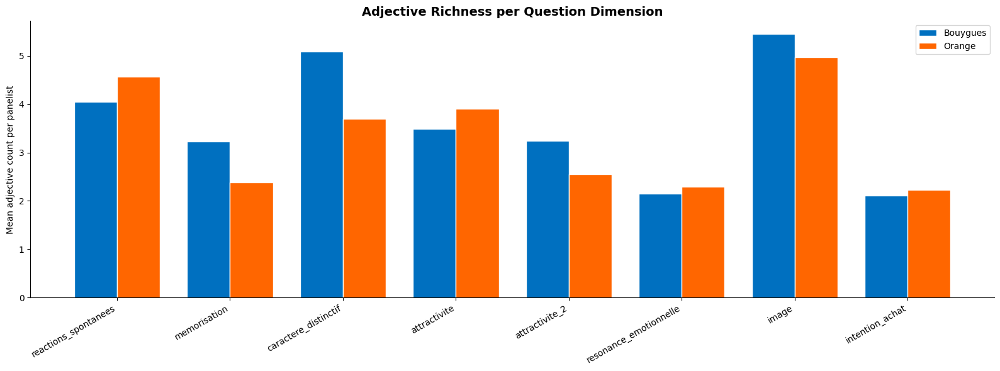

In [42]:
bdf = richness[richness["brand"] == "Bouygues"].reset_index(drop=True)
odf = richness[richness["brand"] == "Orange"].reset_index(drop=True)

x = np.arange(len(bdf))
width = 0.38

fig, ax = plt.subplots(figsize=(16, 6))
ax.bar(x - width/2, bdf["mean_adj_count"], width, label="Bouygues", color="#0070C0", edgecolor="white")
ax.bar(x + width/2, odf["mean_adj_count"], width, label="Orange", color="#FF6600", edgecolor="white")

short_labels = [l.replace("bouygues_", "").replace("orange_", "") for l in bdf["question"]]
ax.set_xticks(x)
ax.set_xticklabels(short_labels, rotation=30, ha="right", fontsize=10)
ax.set_ylabel("Mean adjective count per panelist")
ax.set_title("Adjective Richness per Question Dimension", fontsize=14, fontweight="bold")
ax.legend()
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.savefig("richness_per_question.png", dpi=150, bbox_inches="tight")
plt.show()


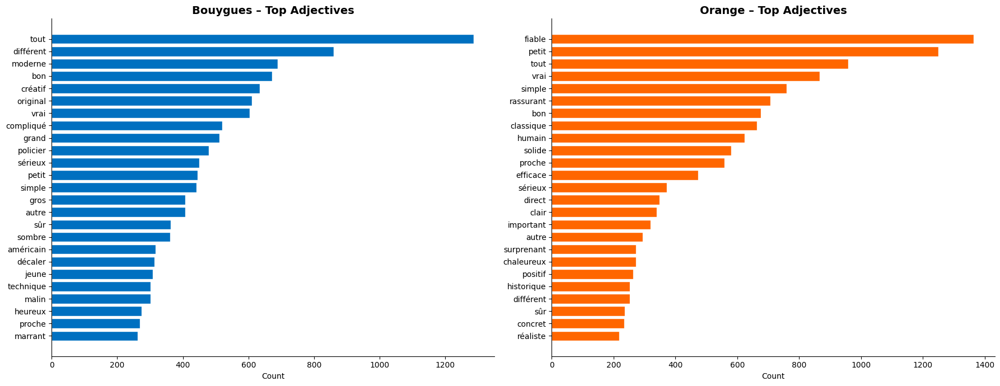

In [43]:
TOP_N = 25

bouygues_freq = Counter([adj for lst in df["adj_bouygues_full_parsed"] for adj in lst])
orange_freq = Counter([adj for lst in df["adj_orange_full_parsed"] for adj in lst])

top_b = pd.DataFrame(bouygues_freq.most_common(TOP_N), columns=["adjective", "count"])
top_o = pd.DataFrame(orange_freq.most_common(TOP_N), columns=["adjective", "count"])

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, data, color, title in [
    (axes[0], top_b, "#0070C0", "Bouygues – Top Adjectives"),
    (axes[1], top_o, "#FF6600", "Orange – Top Adjectives"),
]:
    ax.barh(data["adjective"][::-1], data["count"][::-1], color=color, edgecolor="white")
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_xlabel("Count")
    ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig("top_adjectives_bar.png", dpi=150, bbox_inches="tight")
plt.show()


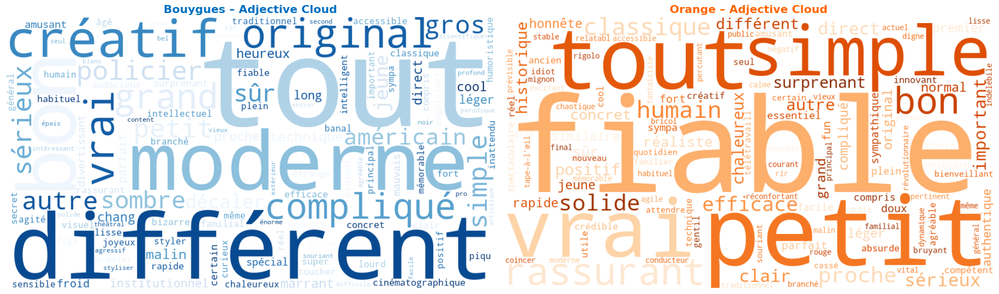

In [44]:
def make_wc(freq, colormap, bg="white"):
    return WordCloud(width=900, height=500, background_color=bg,
                     colormap=colormap, max_words=120,
                     prefer_horizontal=0.85).generate_from_frequencies(freq)

wc_b = make_wc(dict(bouygues_freq), "Blues")
wc_o = make_wc(dict(orange_freq), "Oranges")

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
axes[0].imshow(wc_b, interpolation="bilinear")
axes[0].set_title("Bouygues – Adjective Cloud", fontsize=16, fontweight="bold", color="#0070C0")
axes[0].axis("off")
axes[1].imshow(wc_o, interpolation="bilinear")
axes[1].set_title("Orange – Adjective Cloud", fontsize=16, fontweight="bold", color="#FF6600")
axes[1].axis("off")
plt.tight_layout()
plt.savefig("wordclouds_full.png", dpi=150, bbox_inches="tight")
plt.show()


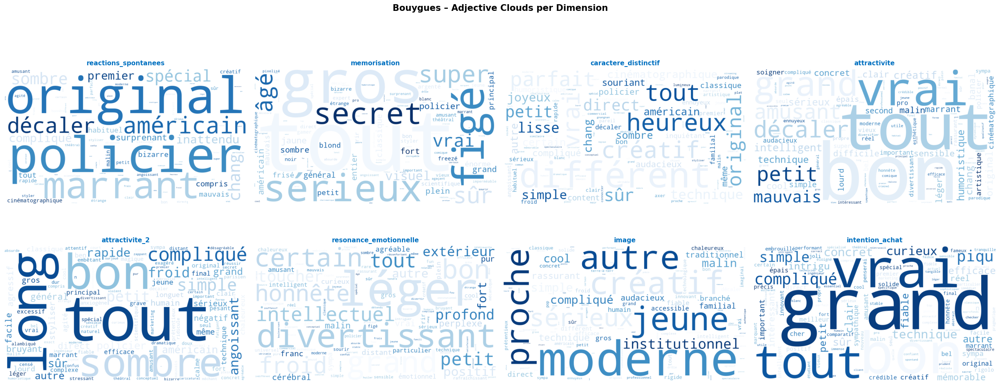

In [45]:
dim_labels_b = [c.replace("Q_bouygues_", "").replace("_1_adjs", "").replace("_adjs", "") for c in BOUYGUES_Q_COLS]

fig, axes = plt.subplots(2, 4, figsize=(24, 10))
for ax, col, label in zip(axes.flatten(), BOUYGUES_Q_COLS, dim_labels_b):
    freq = Counter([adj for lst in df[col + "_parsed"] for adj in lst])
    if freq:
        wc = make_wc(freq, "Blues")
        ax.imshow(wc, interpolation="bilinear")
    ax.set_title(label, fontsize=11, fontweight="bold", color="#0070C0")
    ax.axis("off")

plt.suptitle("Bouygues – Adjective Clouds per Dimension", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("wordclouds_bouygues_dims.png", dpi=150, bbox_inches="tight")
plt.show()


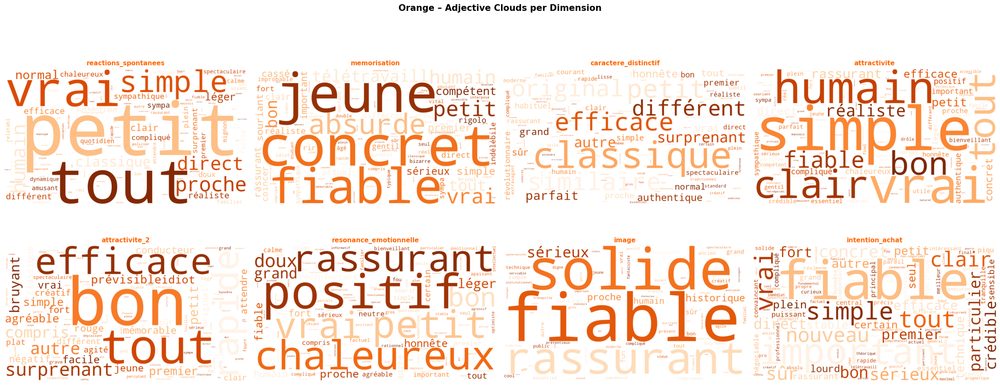

In [46]:
dim_labels_o = [c.replace("Q_orange_", "").replace("_1_adjs", "").replace("_adjs", "") for c in ORANGE_Q_COLS]

fig, axes = plt.subplots(2, 4, figsize=(24, 10))
for ax, col, label in zip(axes.flatten(), ORANGE_Q_COLS, dim_labels_o):
    freq = Counter([adj for lst in df[col + "_parsed"] for adj in lst])
    if freq:
        wc = make_wc(freq, "Oranges")
        ax.imshow(wc, interpolation="bilinear")
    ax.set_title(label, fontsize=11, fontweight="bold", color="#FF6600")
    ax.axis("off")

plt.suptitle("Orange – Adjective Clouds per Dimension", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("wordclouds_orange_dims.png", dpi=150, bbox_inches="tight")
plt.show()


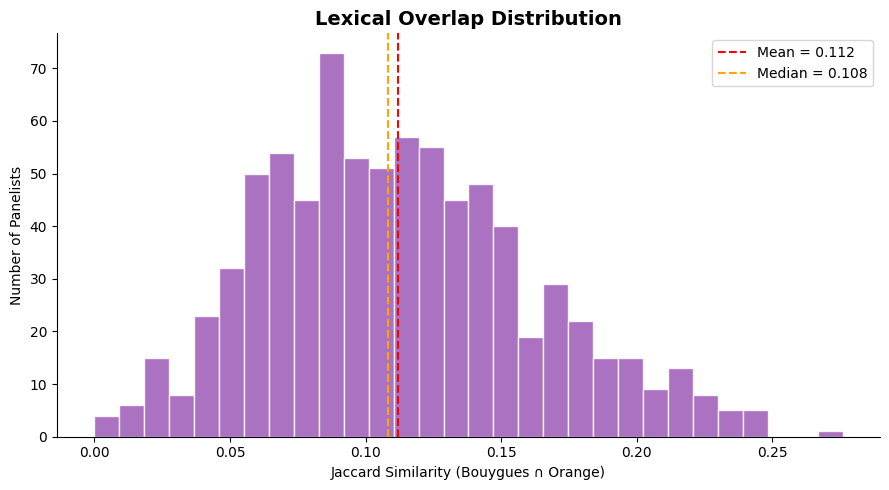

In [47]:
fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(df["jaccard"], bins=30, color="#9B59B6", edgecolor="white", alpha=0.85)
ax.axvline(df["jaccard"].mean(), color="red", linestyle="--", linewidth=1.5, label=f"Mean = {df['jaccard'].mean():.3f}")
ax.axvline(df["jaccard"].median(), color="orange", linestyle="--", linewidth=1.5, label=f"Median = {df['jaccard'].median():.3f}")
ax.set_xlabel("Jaccard Similarity (Bouygues ∩ Orange)")
ax.set_ylabel("Number of Panelists")
ax.set_title("Lexical Overlap Distribution", fontsize=14, fontweight="bold")
ax.legend()
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.savefig("jaccard_histogram.png", dpi=150, bbox_inches="tight")
plt.show()


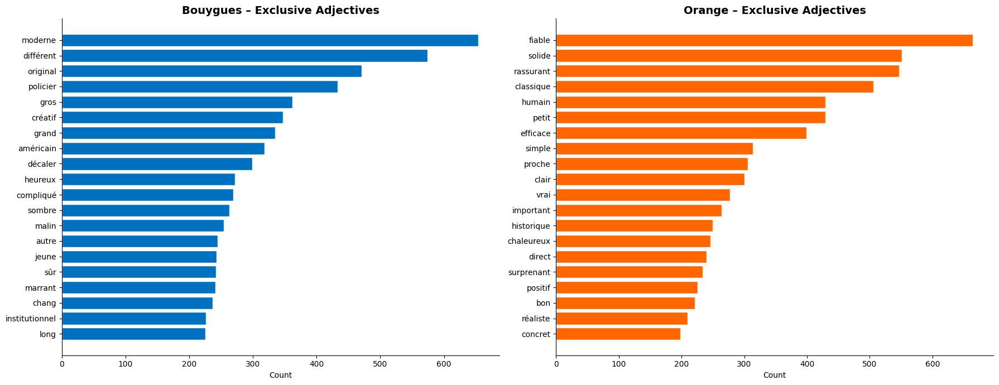

In [48]:
bouygues_excl = Counter()
orange_excl = Counter()

for _, row in df.iterrows():
    sb = set(row["adj_bouygues_full_parsed"])
    so = set(row["adj_orange_full_parsed"])
    for adj in sb - so: bouygues_excl[adj] += 1
    for adj in so - sb: orange_excl[adj] += 1

top_be = pd.DataFrame(bouygues_excl.most_common(20), columns=["adjective", "count"])
top_oe = pd.DataFrame(orange_excl.most_common(20), columns=["adjective", "count"])

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, data, color, title in [
    (axes[0], top_be, "#0070C0", "Bouygues – Exclusive Adjectives"),
    (axes[1], top_oe, "#FF6600", "Orange – Exclusive Adjectives"),
]:
    ax.barh(data["adjective"][::-1], data["count"][::-1], color=color, edgecolor="white")
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_xlabel("Count")
    ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig("exclusive_adjectives.png", dpi=150, bbox_inches="tight")
plt.show()


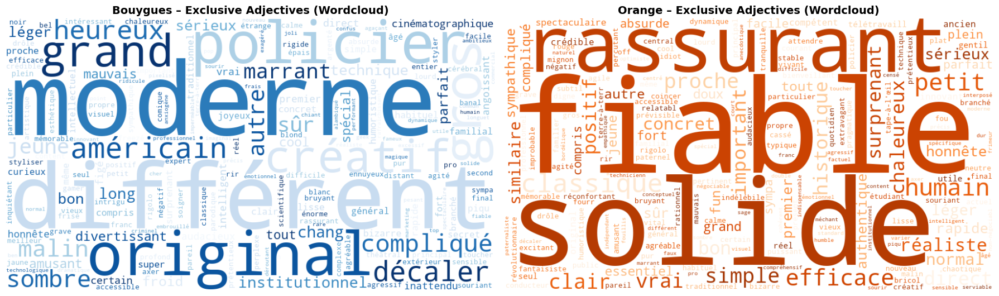

In [49]:
from wordcloud import WordCloud

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

wc_b = WordCloud(
    width=900,
    height=500,
    background_color="white",
    colormap="Blues"
).generate_from_frequencies(bouygues_excl)

axes[0].imshow(wc_b, interpolation="bilinear")
axes[0].axis("off")
axes[0].set_title("Bouygues – Exclusive Adjectives (Wordcloud)", fontsize=14, fontweight="bold")

wc_o = WordCloud(
    width=900,
    height=500,
    background_color="white",
    colormap="Oranges"
).generate_from_frequencies(orange_excl)

axes[1].imshow(wc_o, interpolation="bilinear")
axes[1].axis("off")
axes[1].set_title("Orange – Exclusive Adjectives (Wordcloud)", fontsize=14, fontweight="bold")

plt.tight_layout()

plt.savefig(
    "exclusive_adjectives_wordcloud.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

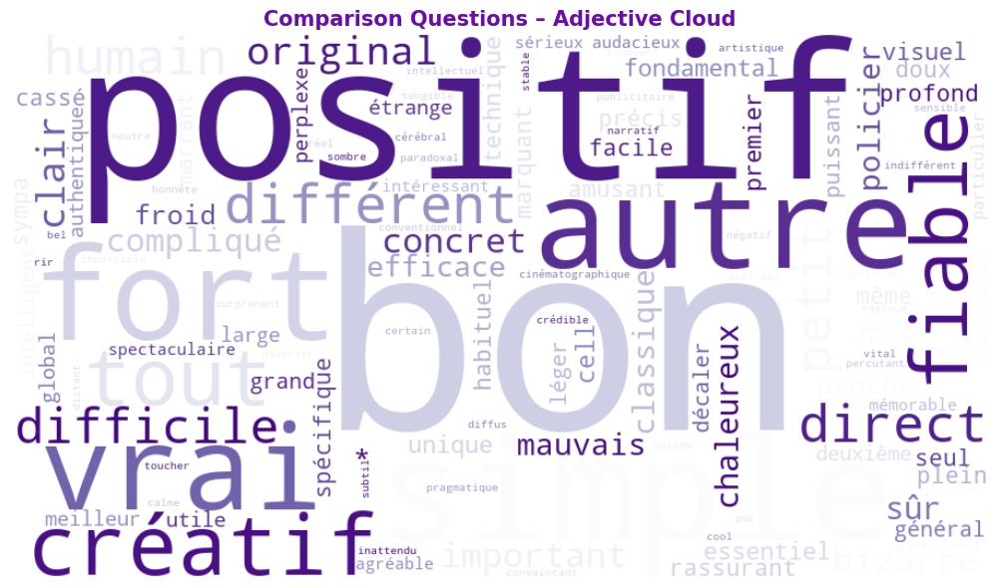

In [50]:
comp_freq = Counter([adj for col in COMP_COLS for lst in df[col + "_parsed"] for adj in lst])

wc_comp = make_wc(comp_freq, "Purples")
fig, ax = plt.subplots(figsize=(12, 6))
ax.imshow(wc_comp, interpolation="bilinear")
ax.set_title("Comparison Questions – Adjective Cloud", fontsize=15, fontweight="bold", color="#6A0DAD")
ax.axis("off")
plt.tight_layout()
plt.savefig("wordcloud_comparaison.png", dpi=150, bbox_inches="tight")
plt.show()


## Nouns

In [51]:
import pandas as pd
import numpy as np
import ast
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import spacy


In [52]:
!python -m spacy download fr_core_news_sm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 32.9 MB/s  0:00:00 eta 0:00:01
✔ Download and installation successful
You can now load the package via spacy.load('fr_core_news_sm')


In [53]:
nlp = spacy.load("fr_core_news_sm")


In [54]:
df = pd.read_csv("interviews.csv")
print(df.shape)
df.head()


(800, 48)


,panelist_id,interview_number,timestamp,age,children,csp,education,gender,income_level,location.city_size,...,Q_orange_attractivite_2,Q_orange_resonance_emotionnelle_1,Q_orange_image_1,Q_orange_intention_achat_1,Q_comparaison_1,Q_comparaison_2,Q_comparaison_3,Q_comparaison_4,Q_comparaison_5,Q_comparaison_6
0,67b0d135d362f5886c2e5cfe,1,2025-11-15T21:16:58.828353,28,NaN,Ouvriers,Secondary,Male,22000,Large city,...,C'est un peu un enchaînement de trucs négatifs...,Pas grand-chose de fort. Une sorte d'empathie ...,"Ça donne une image de marque solide, fiable. L...","Oui, parce qu'elle parle de fiabilité. Et au f...",J'ai préféré celle de Bouygues. Elle était plu...,"Celle de Bouygues, sans hésiter. L'idée de la ...",Bouygues. Clairement. Pour son concept. Ils on...,Bouygues. Ça m'a fait rire. C'est une émotion ...,C'est marrant parce que même si j'ai préféré l...,Je dirais Orange. Leur promesse c'est 'la fiab...
1,67b0d12ed362f5886c2e5b9c,2,2025-11-15T21:17:04.626005,23,NaN,Employés,Secondary,Male,15000,Small village,...,"Non, pas de point négatif. C'est une bonne pub...",Un sentiment de... familiarité. De l'empathie ...,Ça renforce l'image d'Orange comme une marque ...,"Oui, aussi. Le message 'la fibre la plus fiabl...",Hmm... difficile. J'ai bien aimé les deux pour...,"Celle de Bouygues, je pense. L'idée de la 'pol...","Bouygues, sans aucune hésitation. Pour tout le...",Bouygues m'a fait plus rire. Donc si on parle ...,"Alors là, c'est marrant, mais je dirais peut-ê...",Je dirais Orange. Leur promesse c'est la fiabi...
2,67b0d12bd362f5886c2e5b09,3,2025-11-15T21:17:09.971836,47,"17, 14, 11",Ouvriers,Secondary,Male,27000,Small village,...,"Ça va très vite, on passe d'une scène à l'autr...","De la sympathie, je dirais. On se reconnaît da...",Ça confirme l'image que j'ai d'Orange. C'est l...,"Oui, un peu plus que l'autre. Parce qu'ils ins...","J'ai trouvé la pub Bouygues très drôle, mais j...",Celle de Bouygues. Parce que l'histoire est te...,"Bouygues, sans aucune hésitation. L'idée de l'...","Hmm... 'fortes', aucune des deux. Mais Bouygue...",Plutôt Orange. Parce qu'elle met le doigt sur ...,Je dirais Orange. Le message 'la fibre la plus...
3,67b0d127d362f5886c2e5a4a,4,2025-11-15T21:17:18.211898,68,"38, 35",Retraités,No formal education,Male,21000,Small village,...,"Bon, les jeunes avec leur histoire de banane, ...",Un sentiment de... fiabilité. On se dit 'ah ou...,Une image solide. Quelqu'un sur qui on peut co...,"Oui, ça, ça parle plus. 'La fibre la plus fiab...","Je préfère celle d'Orange, sans hésiter. Elle ...",Celle de Bouygues est peut-être plus marquante...,"Celle de Bouygues sort plus du lot, c'est sûr....","Celle d'Orange, elle m'a rassuré. C'est une ém...","Celle d'Orange, clairement. Elle parle de fiab...","Orange, encore. Ils montrent que ça marche bie..."
4,67b0d12cd362f5886c2e5b4a,5,2025-11-15T21:17:17.641665,29,NaN,Cadres (y compris commerçants & artisans),Higher education,Female,45000,Large city,...,Moins plu... disons que c'est moins surprenant...,"Un sentiment de... réconfort, de réassurance. ...","Ça renforce leur image de leader, de valeur sû...","Oui, parce qu'elle appuie sur un point crucial...",Je préfère celle de Bouygues. Pour l'originali...,"Bouygues, sans hésiter. Le concept de 'scène d...","Encore une fois, Bouygues. Pour son parti pris...",Ça dépend de ce qu'on appelle 'fort'. Bouygues...,C'est difficile... Bouygues m'intrigue sur une...,Orange illustre mieux la promesse globale de '...


In [55]:
BOUYGUES_Q_COLS = [
    "Q_bouygues_reactions_spontanees_1",
    "Q_bouygues_memorisation_1",
    "Q_bouygues_caractere_distinctif_1",
    "Q_bouygues_attractivite_1",
    "Q_bouygues_attractivite_2",
    "Q_bouygues_resonance_emotionnelle_1",
    "Q_bouygues_image_1",
    "Q_bouygues_intention_achat_1",
]

ORANGE_Q_COLS = [
    "Q_orange_reactions_spontanees_1",
    "Q_orange_memorisation_1",
    "Q_orange_caractere_distinctif_1",
    "Q_orange_attractivite_1",
    "Q_orange_attractivite_2",
    "Q_orange_resonance_emotionnelle_1",
    "Q_orange_image_1",
    "Q_orange_intention_achat_1",
]

COMP_COLS = [f"Q_comparaison_{i}" for i in range(1, 7)]

ALL_TEXT_COLS = BOUYGUES_Q_COLS + ORANGE_Q_COLS + COMP_COLS


In [56]:
STOPWORDS_NOUNS = {"chose", "ça", "fois", "truc", "coup", "peu", "tout", "rien", "quelque"}

def extract_nouns(text):
    if pd.isna(text) or str(text).strip() == "":
        return []
    doc = nlp(str(text)[:500])
    return [
        token.lemma_.lower() for token in doc
        if token.pos_ == "NOUN"
        and len(token.lemma_) > 2
        and token.lemma_.lower() not in STOPWORDS_NOUNS
    ]

for col in ALL_TEXT_COLS:
    df[col + "_nouns"] = df[col].apply(extract_nouns)

df[["panelist_id"] + [c + "_nouns" for c in BOUYGUES_Q_COLS[:2]]].head()


,panelist_id,Q_bouygues_reactions_spontanees_1_nouns,Q_bouygues_memorisation_1_nouns
0,67b0d135d362f5886c2e5cfe,"[marrant, série, policière, expert, genre, wif...","[délire, scène, crime, ruban, sécurité, enquêt..."
1,67b0d12ed362f5886c2e5b9c,"[parodie, série, policière, expert, cela, change]","[début, mec, vie, mamie, appel, vidéo, drôle, ..."
2,67b0d12bd362f5886c2e5b09,"[série, policière, expert, internet, change]","[côté, enquête, mallette, meurtre, fait, wifi,..."
3,67b0d127d362f5886c2e5a4a,"[enquête, police, wifi, rapport, début, histoi...","[vieux, bloquée, écran, grosse, lunette, drôle..."
4,67b0d12cd362f5886c2e5b4a,"[change, idée, scène, crime, problème]","[concept, fait, inspecteur, rubalise, sécurité..."


In [57]:
df["nouns_bouygues_full"] = df[[c + "_nouns" for c in BOUYGUES_Q_COLS]].apply(
    lambda row: [n for lst in row for n in lst], axis=1
)
df["nouns_orange_full"] = df[[c + "_nouns" for c in ORANGE_Q_COLS]].apply(
    lambda row: [n for lst in row for n in lst], axis=1
)

df[["panelist_id", "nouns_bouygues_full", "nouns_orange_full"]].head()


,panelist_id,nouns_bouygues_full,nouns_orange_full
0,67b0d135d362f5886c2e5cfe,"[marrant, série, policière, expert, genre, wif...","[hmm, vraie, vie, galère, mec, femme, jambe, p..."
1,67b0d12ed362f5886c2e5b9c,"[parodie, série, policière, expert, cela, chan...","[scène, vie, jour, galère, terre-à-terre, grou..."
2,67b0d12bd362f5886c2e5b09,"[série, policière, expert, internet, change, c...","[vraie, vie, galère, jour, suite, jeune, banan..."
3,67b0d127d362f5886c2e5a4a,"[enquête, police, wifi, rapport, début, histoi...","[gens, vie, jour, dame, jambe, plâtre, canapé,..."
4,67b0d12cd362f5886c2e5b4a,"[change, idée, scène, crime, problème, concept...","[montage, scène, vie, galère, quotidien, émoti..."


In [58]:
def jaccard(a, b):
    sa, sb = set(a), set(b)
    union = sa | sb
    return len(sa & sb) / len(union) if union else 0.0

df["noun_jaccard"] = df.apply(lambda r: jaccard(r["nouns_bouygues_full"], r["nouns_orange_full"]), axis=1)
df["noun_n_overlap"] = df.apply(lambda r: len(set(r["nouns_bouygues_full"]) & set(r["nouns_orange_full"])), axis=1)
df["noun_n_bouygues_only"] = df.apply(lambda r: len(set(r["nouns_bouygues_full"]) - set(r["nouns_orange_full"])), axis=1)
df["noun_n_orange_only"] = df.apply(lambda r: len(set(r["nouns_orange_full"]) - set(r["nouns_bouygues_full"])), axis=1)
df["noun_n_bouygues_total"] = df["nouns_bouygues_full"].apply(len)
df["noun_n_orange_total"] = df["nouns_orange_full"].apply(len)

df[["noun_jaccard", "noun_n_overlap", "noun_n_bouygues_only", "noun_n_orange_only",
    "noun_n_bouygues_total", "noun_n_orange_total"]].describe().round(3)


,noun_jaccard,noun_n_overlap,noun_n_bouygues_only,noun_n_orange_only,noun_n_bouygues_total,noun_n_orange_total
count,800.000,800.000,800.000,800.000,800.000,800.000
mean,0.111,9.785,41.868,38.556,59.254,56.150
std,0.035,2.696,8.736,7.735,10.696,10.034
min,0.021,2.000,22.000,21.000,33.000,34.000
25%,0.087,8.000,35.000,33.000,51.000,49.000
50%,0.108,10.000,41.500,38.000,58.000,55.000
75%,0.132,11.000,48.000,44.000,66.000,63.000
max,0.254,18.000,66.000,65.000,96.000,88.000


In [59]:
q_labels = [c.replace("Q_bouygues_", "").replace("Q_orange_", "") for c in BOUYGUES_Q_COLS + ORANGE_Q_COLS]
q_noun_cols = [c + "_nouns" for c in BOUYGUES_Q_COLS + ORANGE_Q_COLS]

richness = pd.DataFrame({
    "question": q_labels,
    "mean_noun_count": [df[c].apply(len).mean() for c in q_noun_cols],
    "brand": ["Bouygues"] * len(BOUYGUES_Q_COLS) + ["Orange"] * len(ORANGE_Q_COLS),
})

richness


,question,mean_noun_count,brand
0,reactions_spontanees_1,7.33875,Bouygues
1,memorisation_1,11.15250,Bouygues
2,caractere_distinctif_1,8.46625,Bouygues
3,attractivite_1,8.42750,Bouygues
4,attractivite_2,7.03125,Bouygues
5,resonance_emotionnelle_1,4.92125,Bouygues
6,image_1,5.34000,Bouygues
7,intention_achat_1,6.57625,Bouygues
8,reactions_spontanees_1,5.57750,Orange
9,memorisation_1,11.14875,Orange


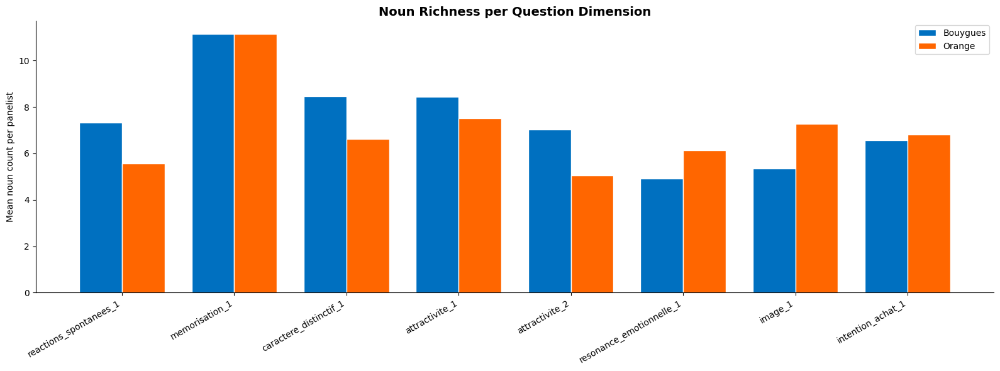

In [60]:
bdf = richness[richness["brand"] == "Bouygues"].reset_index(drop=True)
odf = richness[richness["brand"] == "Orange"].reset_index(drop=True)

x = np.arange(len(bdf))
width = 0.38

fig, ax = plt.subplots(figsize=(16, 6))
ax.bar(x - width/2, bdf["mean_noun_count"], width, label="Bouygues", color="#0070C0", edgecolor="white")
ax.bar(x + width/2, odf["mean_noun_count"], width, label="Orange", color="#FF6600", edgecolor="white")
ax.set_xticks(x)
ax.set_xticklabels(bdf["question"], rotation=30, ha="right", fontsize=10)
ax.set_ylabel("Mean noun count per panelist")
ax.set_title("Noun Richness per Question Dimension", fontsize=14, fontweight="bold")
ax.legend()
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.savefig("noun_richness_per_question.png", dpi=150, bbox_inches="tight")
plt.show()


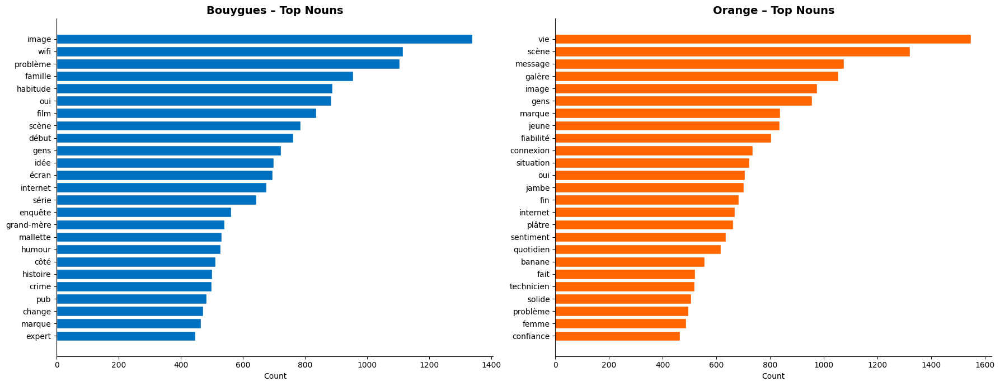

In [61]:
TOP_N = 25

bouygues_freq = Counter([n for lst in df["nouns_bouygues_full"] for n in lst])
orange_freq = Counter([n for lst in df["nouns_orange_full"] for n in lst])

top_b = pd.DataFrame(bouygues_freq.most_common(TOP_N), columns=["noun", "count"])
top_o = pd.DataFrame(orange_freq.most_common(TOP_N), columns=["noun", "count"])

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, data, color, title in [
    (axes[0], top_b, "#0070C0", "Bouygues – Top Nouns"),
    (axes[1], top_o, "#FF6600", "Orange – Top Nouns"),
]:
    ax.barh(data["noun"][::-1], data["count"][::-1], color=color, edgecolor="white")
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_xlabel("Count")
    ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig("top_nouns_bar.png", dpi=150, bbox_inches="tight")
plt.show()


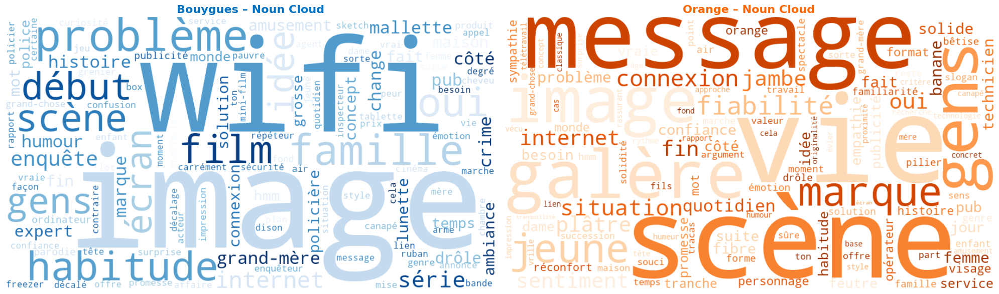

In [62]:
def make_wc(freq, colormap):
    return WordCloud(width=900, height=500, background_color="white",
                     colormap=colormap, max_words=120,
                     prefer_horizontal=0.85).generate_from_frequencies(freq)

wc_b = make_wc(dict(bouygues_freq), "Blues")
wc_o = make_wc(dict(orange_freq), "Oranges")

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
axes[0].imshow(wc_b, interpolation="bilinear")
axes[0].set_title("Bouygues – Noun Cloud", fontsize=16, fontweight="bold", color="#0070C0")
axes[0].axis("off")
axes[1].imshow(wc_o, interpolation="bilinear")
axes[1].set_title("Orange – Noun Cloud", fontsize=16, fontweight="bold", color="#FF6600")
axes[1].axis("off")
plt.tight_layout()
plt.savefig("wordclouds_nouns.png", dpi=150, bbox_inches="tight")
plt.show()


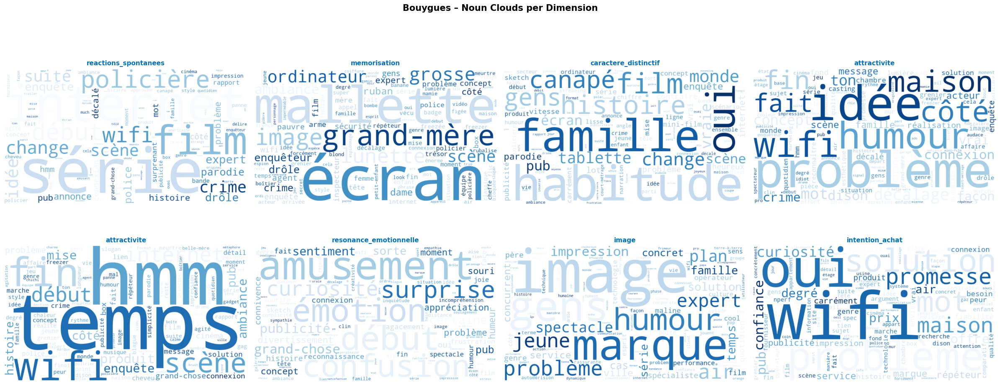

In [63]:
dim_labels_b = [c.replace("Q_bouygues_", "").replace("_1", "").replace("_2", "") for c in BOUYGUES_Q_COLS]

fig, axes = plt.subplots(2, 4, figsize=(24, 10))
for ax, col, label in zip(axes.flatten(), BOUYGUES_Q_COLS, dim_labels_b):
    freq = Counter([n for lst in df[col + "_nouns"] for n in lst])
    if freq:
        ax.imshow(make_wc(freq, "Blues"), interpolation="bilinear")
    ax.set_title(label, fontsize=11, fontweight="bold", color="#0070C0")
    ax.axis("off")

plt.suptitle("Bouygues – Noun Clouds per Dimension", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("noun_clouds_bouygues_dims.png", dpi=150, bbox_inches="tight")
plt.show()


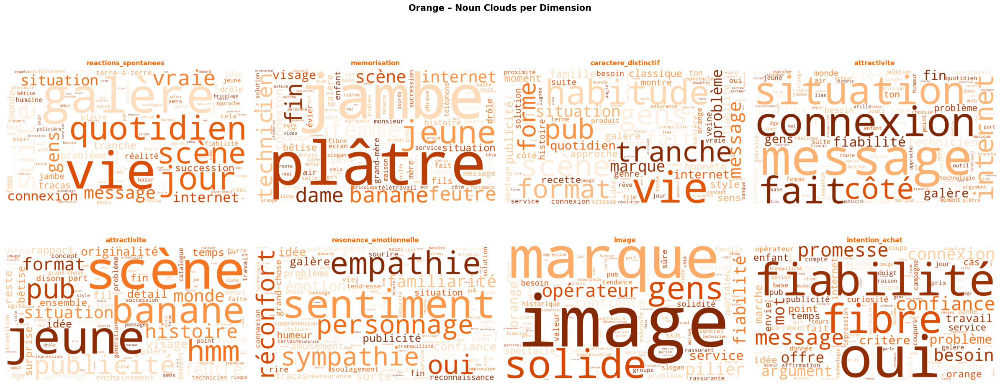

In [64]:
dim_labels_o = [c.replace("Q_orange_", "").replace("_1", "").replace("_2", "") for c in ORANGE_Q_COLS]

fig, axes = plt.subplots(2, 4, figsize=(24, 10))
for ax, col, label in zip(axes.flatten(), ORANGE_Q_COLS, dim_labels_o):
    freq = Counter([n for lst in df[col + "_nouns"] for n in lst])
    if freq:
        ax.imshow(make_wc(freq, "Oranges"), interpolation="bilinear")
    ax.set_title(label, fontsize=11, fontweight="bold", color="#FF6600")
    ax.axis("off")

plt.suptitle("Orange – Noun Clouds per Dimension", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("noun_clouds_orange_dims.png", dpi=150, bbox_inches="tight")
plt.show()


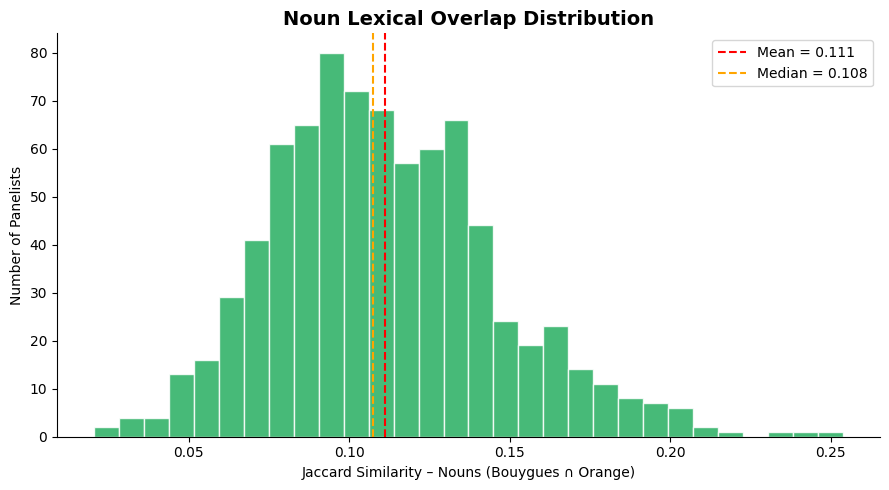

In [65]:
fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(df["noun_jaccard"], bins=30, color="#27AE60", edgecolor="white", alpha=0.85)
ax.axvline(df["noun_jaccard"].mean(), color="red", linestyle="--", linewidth=1.5, label=f"Mean = {df['noun_jaccard'].mean():.3f}")
ax.axvline(df["noun_jaccard"].median(), color="orange", linestyle="--", linewidth=1.5, label=f"Median = {df['noun_jaccard'].median():.3f}")
ax.set_xlabel("Jaccard Similarity – Nouns (Bouygues ∩ Orange)")
ax.set_ylabel("Number of Panelists")
ax.set_title("Noun Lexical Overlap Distribution", fontsize=14, fontweight="bold")
ax.legend()
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.savefig("noun_jaccard_histogram.png", dpi=150, bbox_inches="tight")
plt.show()


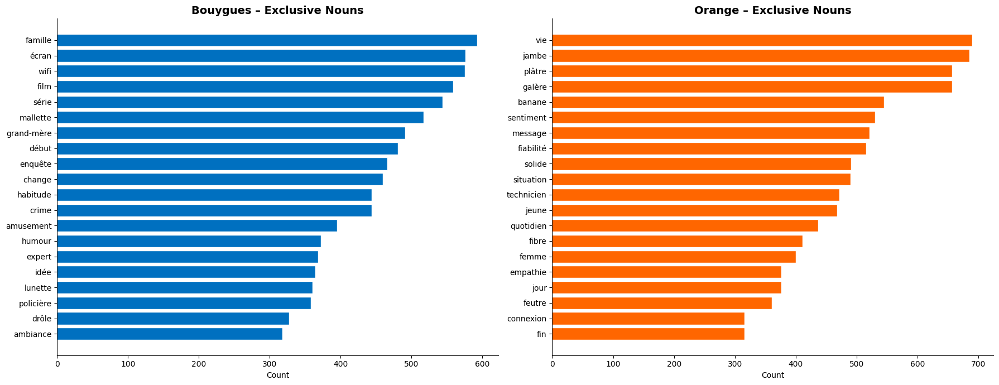

In [66]:
bouygues_excl = Counter()
orange_excl = Counter()

for _, row in df.iterrows():
    sb = set(row["nouns_bouygues_full"])
    so = set(row["nouns_orange_full"])
    for n in sb - so: bouygues_excl[n] += 1
    for n in so - sb: orange_excl[n] += 1

top_be = pd.DataFrame(bouygues_excl.most_common(20), columns=["noun", "count"])
top_oe = pd.DataFrame(orange_excl.most_common(20), columns=["noun", "count"])

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, data, color, title in [
    (axes[0], top_be, "#0070C0", "Bouygues – Exclusive Nouns"),
    (axes[1], top_oe, "#FF6600", "Orange – Exclusive Nouns"),
]:
    ax.barh(data["noun"][::-1], data["count"][::-1], color=color, edgecolor="white")
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_xlabel("Count")
    ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig("exclusive_nouns.png", dpi=150, bbox_inches="tight")
plt.show()


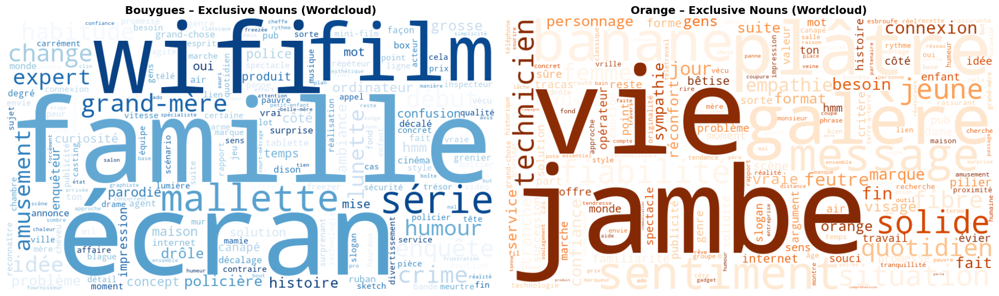

In [67]:
from wordcloud import WordCloud


fig, axes = plt.subplots(1, 2, figsize=(18, 7))

wc_b = WordCloud(
    width=900,
    height=500,
    background_color="white",
    colormap="Blues",
    max_words=200
).generate_from_frequencies(bouygues_excl)

axes[0].imshow(wc_b, interpolation="bilinear")
axes[0].axis("off")
axes[0].set_title("Bouygues – Exclusive Nouns (Wordcloud)", fontsize=14, fontweight="bold")


wc_o = WordCloud(
    width=900,
    height=500,
    background_color="white",
    colormap="Oranges",
    max_words=200
).generate_from_frequencies(orange_excl)

axes[1].imshow(wc_o, interpolation="bilinear")
axes[1].axis("off")
axes[1].set_title("Orange – Exclusive Nouns (Wordcloud)", fontsize=14, fontweight="bold")

plt.tight_layout()

plt.savefig(
    "exclusive_nouns_wordcloud.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

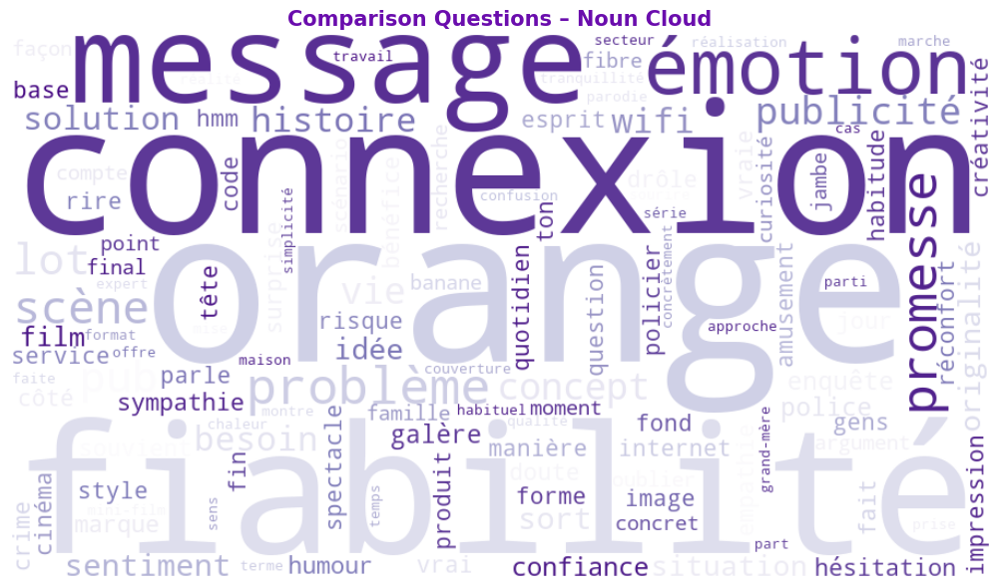

In [68]:
comp_freq = Counter([n for col in COMP_COLS for lst in df[col + "_nouns"] for n in lst])

fig, ax = plt.subplots(figsize=(12, 6))
ax.imshow(make_wc(comp_freq, "Purples"), interpolation="bilinear")
ax.set_title("Comparison Questions – Noun Cloud", fontsize=15, fontweight="bold", color="#6A0DAD")
ax.axis("off")
plt.tight_layout()
plt.savefig("noun_cloud_comparaison.png", dpi=150, bbox_inches="tight")
plt.show()


## Verbs


In [69]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import spacy

!python -m spacy download fr_core_news_sm

  Using cached https://github.com/explosion/spacy-models/releases/download/fr_core_news_sm-3.8.0/fr_core_news_sm-3.8.0-py3-none-any.whl (16.3 MB)
✔ Download and installation successful
You can now load the package via spacy.load('fr_core_news_sm')


In [70]:
nlp = spacy.load("fr_core_news_sm")

In [71]:
BOUYGUES_Q_COLS = [
    "Q_bouygues_reactions_spontanees_1",
    "Q_bouygues_memorisation_1",
    "Q_bouygues_caractere_distinctif_1",
    "Q_bouygues_attractivite_1",
    "Q_bouygues_attractivite_2",
    "Q_bouygues_resonance_emotionnelle_1",
    "Q_bouygues_image_1",
    "Q_bouygues_intention_achat_1",
]

ORANGE_Q_COLS = [
    "Q_orange_reactions_spontanees_1",
    "Q_orange_memorisation_1",
    "Q_orange_caractere_distinctif_1",
    "Q_orange_attractivite_1",
    "Q_orange_attractivite_2",
    "Q_orange_resonance_emotionnelle_1",
    "Q_orange_image_1",
    "Q_orange_intention_achat_1",
]

COMP_COLS = [f"Q_comparaison_{i}" for i in range(1, 7)]


In [72]:
STOPWORDS_VERBS = {"être", "avoir", "faire", "dire", "aller", "pouvoir", "vouloir", "voir", "donner"}

def extract_verbs(text):
    if pd.isna(text) or str(text).strip() == "":
        return []
    doc = nlp(str(text)[:500])
    return [
        token.lemma_.lower() for token in doc
        if token.pos_ == "VERB"
        and len(token.lemma_) > 2
        and token.lemma_.lower() not in STOPWORDS_VERBS
    ]

for col in BOUYGUES_Q_COLS + ORANGE_Q_COLS + COMP_COLS:
    df[col + "_verbs"] = df[col].apply(extract_verbs)

df[["panelist_id"] + [c + "_verbs" for c in BOUYGUES_Q_COLS[:2]]].head()


,panelist_id,Q_bouygues_reactions_spontanees_1_verbs,Q_bouygues_memorisation_1_verbs
0,67b0d135d362f5886c2e5cfe,[venir],"[hyper, transporter, trouver]"
1,67b0d12ed362f5886c2e5b9c,"[genre, styler]","[joue, super, marque]"
2,67b0d12bd362f5886c2e5b09,"[original, attendre]","[arriver, figer, arriver]"
3,67b0d127d362f5886c2e5a4a,[compliquer],"[arriver, bizarre]"
4,67b0d12cd362f5886c2e5b4a,"[original, trouver, décaler, aimer]","[figer, amener, hyper, résoudre, visuel]"


In [73]:
df["verbs_bouygues_full"] = df[[c + "_verbs" for c in BOUYGUES_Q_COLS]].apply(
    lambda row: [v for lst in row for v in lst], axis=1
)
df["verbs_orange_full"] = df[[c + "_verbs" for c in ORANGE_Q_COLS]].apply(
    lambda row: [v for lst in row for v in lst], axis=1
)

df[["panelist_id", "verbs_bouygues_full", "verbs_orange_full"]].head()


,panelist_id,verbs_bouygues_full,verbs_orange_full
0,67b0d135d362f5886c2e5cfe,"[venir, hyper, transporter, trouver, montrer, ...","[bricole, parler, fonctionner, devoir, lâcher,..."
1,67b0d12ed362f5886c2e5b9c,"[genre, styler, joue, super, marque, sourire, ...","[facile, reconnaître, essayer, enlever, trouve..."
2,67b0d12bd362f5886c2e5b09,"[original, attendre, arriver, figer, arriver, ...","[ben, comprendre, enlever, penser, trouver, de..."
3,67b0d127d362f5886c2e5a4a,"[compliquer, arriver, bizarre, montre, heureus...","[travailler, imaginer, rassurer, ressembler, t..."
4,67b0d12cd362f5886c2e5b4a,"[original, trouver, décaler, aimer, figer, ame...","[compliquer, devoir, continuer, bosser, positi..."


In [74]:
def jaccard(a, b):
    sa, sb = set(a), set(b)
    union = sa | sb
    return len(sa & sb) / len(union) if union else 0.0

df["verb_jaccard"] = df.apply(lambda r: jaccard(r["verbs_bouygues_full"], r["verbs_orange_full"]), axis=1)
df["verb_n_overlap"] = df.apply(lambda r: len(set(r["verbs_bouygues_full"]) & set(r["verbs_orange_full"])), axis=1)
df["verb_n_bouygues_only"] = df.apply(lambda r: len(set(r["verbs_bouygues_full"]) - set(r["verbs_orange_full"])), axis=1)
df["verb_n_orange_only"] = df.apply(lambda r: len(set(r["verbs_orange_full"]) - set(r["verbs_bouygues_full"])), axis=1)
df["verb_n_bouygues_total"] = df["verbs_bouygues_full"].apply(len)
df["verb_n_orange_total"] = df["verbs_orange_full"].apply(len)

df[["verb_jaccard", "verb_n_overlap", "verb_n_bouygues_only", "verb_n_orange_only",
    "verb_n_bouygues_total", "verb_n_orange_total"]].describe().round(3)


,verb_jaccard,verb_n_overlap,verb_n_bouygues_only,verb_n_orange_only,verb_n_bouygues_total,verb_n_orange_total
count,800.000,800.000,800.000,800.000,800.00,800.000
mean,0.100,3.846,19.342,15.966,25.56,21.655
std,0.049,1.824,4.349,3.715,5.16,4.255
min,0.000,0.000,8.000,6.000,12.00,11.000
25%,0.065,3.000,16.000,13.000,22.00,19.000
50%,0.094,4.000,19.000,16.000,25.00,21.000
75%,0.128,5.000,22.000,18.000,29.00,24.000
max,0.344,11.000,33.000,31.000,42.00,37.000


In [75]:
q_labels = [c.replace("Q_bouygues_", "").replace("Q_orange_", "") for c in BOUYGUES_Q_COLS + ORANGE_Q_COLS]
q_verb_cols = [c + "_verbs" for c in BOUYGUES_Q_COLS + ORANGE_Q_COLS]

richness = pd.DataFrame({
    "question": q_labels,
    "mean_verb_count": [df[c].apply(len).mean() for c in q_verb_cols],
    "brand": ["Bouygues"] * len(BOUYGUES_Q_COLS) + ["Orange"] * len(ORANGE_Q_COLS),
})

richness


,question,mean_verb_count,brand
0,reactions_spontanees_1,2.48500,Bouygues
1,memorisation_1,3.51875,Bouygues
2,caractere_distinctif_1,2.67375,Bouygues
3,attractivite_1,3.91375,Bouygues
4,attractivite_2,3.90000,Bouygues
5,resonance_emotionnelle_1,2.42750,Bouygues
6,image_1,2.62500,Bouygues
7,intention_achat_1,4.01625,Bouygues
8,reactions_spontanees_1,1.56250,Orange
9,memorisation_1,3.36750,Orange


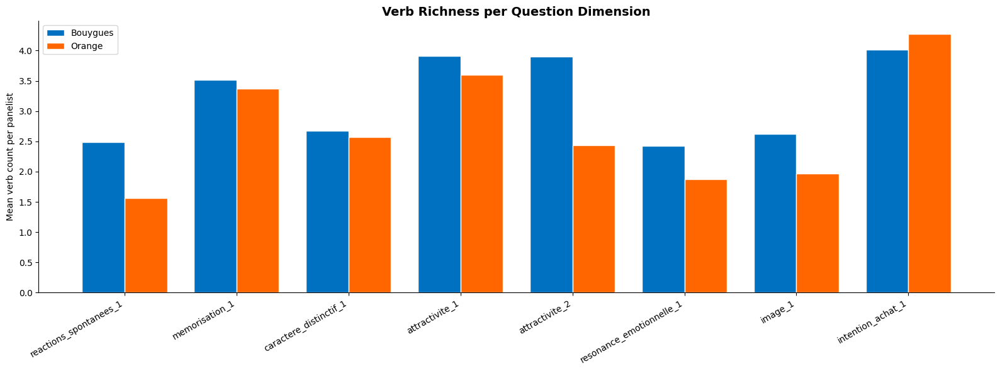

In [76]:
bdf = richness[richness["brand"] == "Bouygues"].reset_index(drop=True)
odf = richness[richness["brand"] == "Orange"].reset_index(drop=True)

x = np.arange(len(bdf))
width = 0.38

fig, ax = plt.subplots(figsize=(16, 6))
ax.bar(x - width/2, bdf["mean_verb_count"], width, label="Bouygues", color="#0070C0", edgecolor="white")
ax.bar(x + width/2, odf["mean_verb_count"], width, label="Orange", color="#FF6600", edgecolor="white")
ax.set_xticks(x)
ax.set_xticklabels(bdf["question"], rotation=30, ha="right", fontsize=10)
ax.set_ylabel("Mean verb count per panelist")
ax.set_title("Verb Richness per Question Dimension", fontsize=14, fontweight="bold")
ax.legend()
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.savefig("verb_richness_per_question.png", dpi=150, bbox_inches="tight")
plt.show()


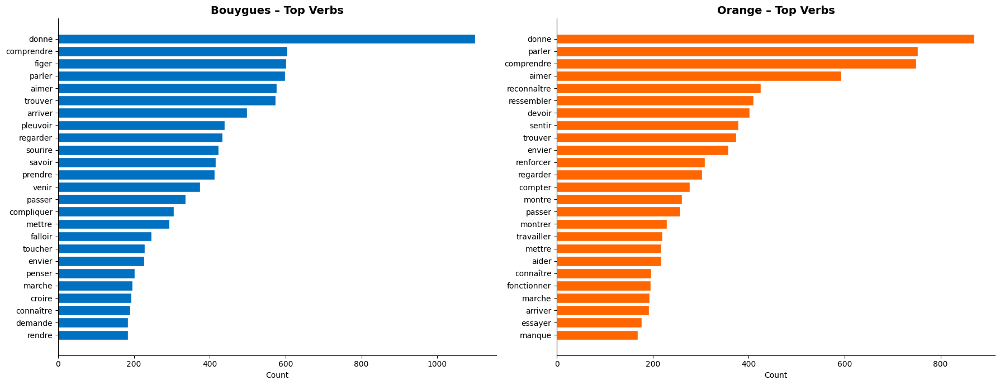

In [77]:
TOP_N = 25

bouygues_vfreq = Counter([v for lst in df["verbs_bouygues_full"] for v in lst])
orange_vfreq = Counter([v for lst in df["verbs_orange_full"] for v in lst])

top_b = pd.DataFrame(bouygues_vfreq.most_common(TOP_N), columns=["verb", "count"])
top_o = pd.DataFrame(orange_vfreq.most_common(TOP_N), columns=["verb", "count"])

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, data, color, title in [
    (axes[0], top_b, "#0070C0", "Bouygues – Top Verbs"),
    (axes[1], top_o, "#FF6600", "Orange – Top Verbs"),
]:
    ax.barh(data["verb"][::-1], data["count"][::-1], color=color, edgecolor="white")
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_xlabel("Count")
    ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig("top_verbs_bar.png", dpi=150, bbox_inches="tight")
plt.show()


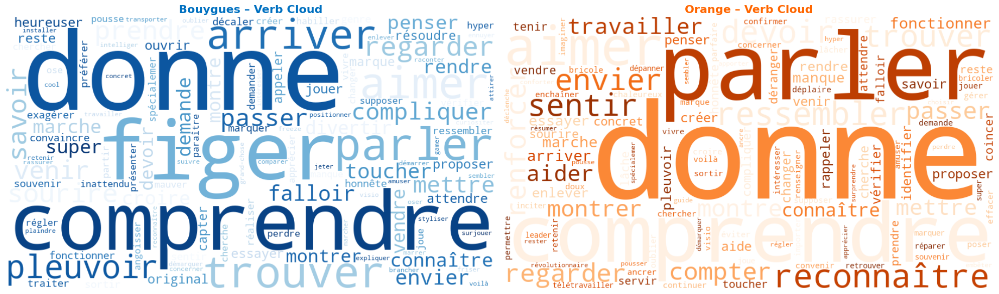

In [78]:
def make_wc(freq, colormap):
    return WordCloud(width=900, height=500, background_color="white",
                     colormap=colormap, max_words=120,
                     prefer_horizontal=0.85).generate_from_frequencies(freq)

wc_b = make_wc(dict(bouygues_vfreq), "Blues")
wc_o = make_wc(dict(orange_vfreq), "Oranges")

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
axes[0].imshow(wc_b, interpolation="bilinear")
axes[0].set_title("Bouygues – Verb Cloud", fontsize=16, fontweight="bold", color="#0070C0")
axes[0].axis("off")
axes[1].imshow(wc_o, interpolation="bilinear")
axes[1].set_title("Orange – Verb Cloud", fontsize=16, fontweight="bold", color="#FF6600")
axes[1].axis("off")
plt.tight_layout()
plt.savefig("wordclouds_verbs.png", dpi=150, bbox_inches="tight")
plt.show()


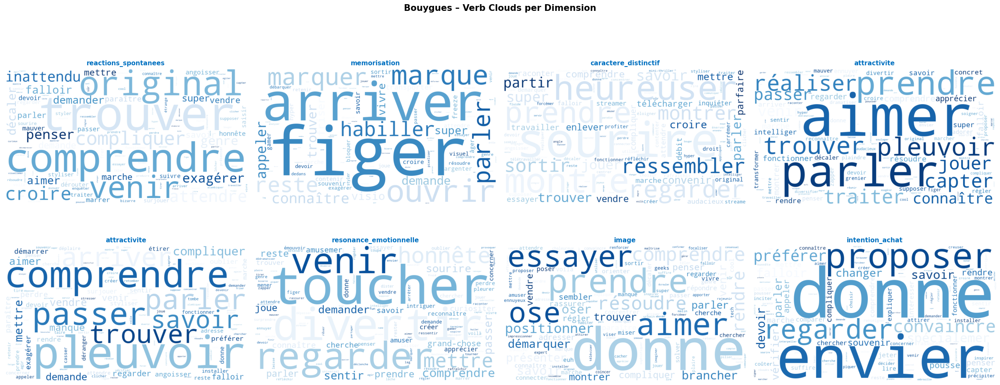

In [79]:
dim_labels_b = [c.replace("Q_bouygues_", "").replace("_1", "").replace("_2", "") for c in BOUYGUES_Q_COLS]

fig, axes = plt.subplots(2, 4, figsize=(24, 10))
for ax, col, label in zip(axes.flatten(), BOUYGUES_Q_COLS, dim_labels_b):
    freq = Counter([v for lst in df[col + "_verbs"] for v in lst])
    if freq:
        ax.imshow(make_wc(freq, "Blues"), interpolation="bilinear")
    ax.set_title(label, fontsize=11, fontweight="bold", color="#0070C0")
    ax.axis("off")

plt.suptitle("Bouygues – Verb Clouds per Dimension", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("verb_clouds_bouygues_dims.png", dpi=150, bbox_inches="tight")
plt.show()


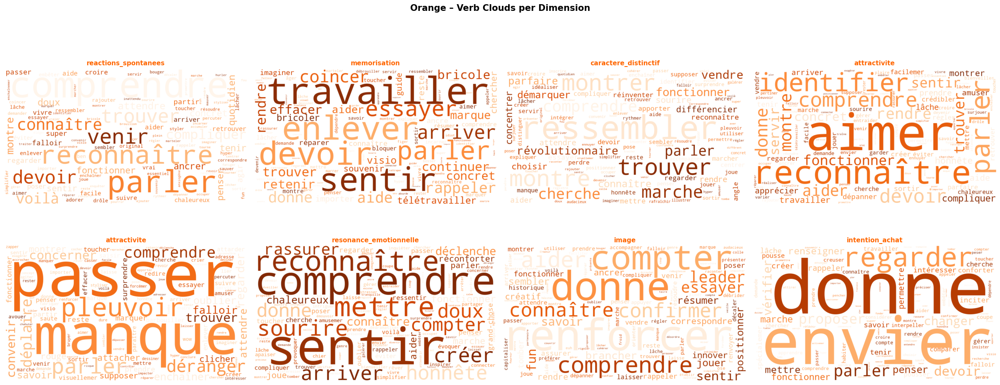

In [80]:
dim_labels_o = [c.replace("Q_orange_", "").replace("_1", "").replace("_2", "") for c in ORANGE_Q_COLS]

fig, axes = plt.subplots(2, 4, figsize=(24, 10))
for ax, col, label in zip(axes.flatten(), ORANGE_Q_COLS, dim_labels_o):
    freq = Counter([v for lst in df[col + "_verbs"] for v in lst])
    if freq:
        ax.imshow(make_wc(freq, "Oranges"), interpolation="bilinear")
    ax.set_title(label, fontsize=11, fontweight="bold", color="#FF6600")
    ax.axis("off")

plt.suptitle("Orange – Verb Clouds per Dimension", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("verb_clouds_orange_dims.png", dpi=150, bbox_inches="tight")
plt.show()


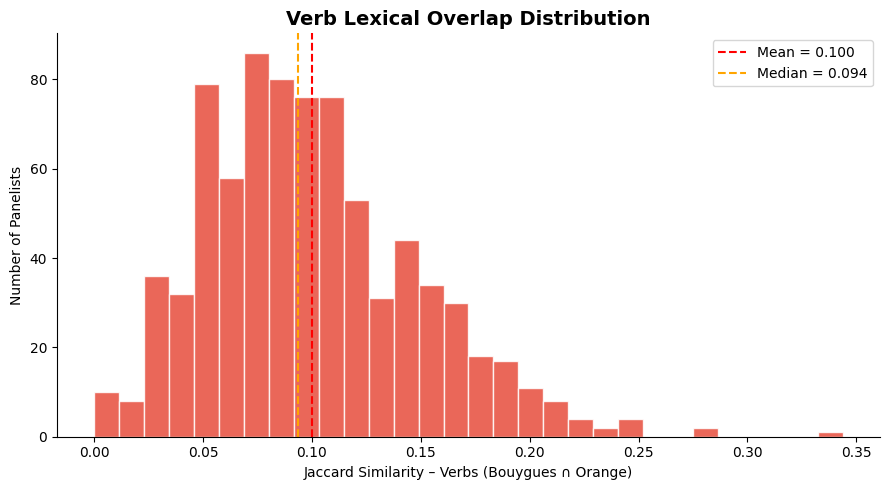

In [81]:
fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(df["verb_jaccard"], bins=30, color="#E74C3C", edgecolor="white", alpha=0.85)
ax.axvline(df["verb_jaccard"].mean(), color="red", linestyle="--", linewidth=1.5, label=f"Mean = {df['verb_jaccard'].mean():.3f}")
ax.axvline(df["verb_jaccard"].median(), color="orange", linestyle="--", linewidth=1.5, label=f"Median = {df['verb_jaccard'].median():.3f}")
ax.set_xlabel("Jaccard Similarity – Verbs (Bouygues ∩ Orange)")
ax.set_ylabel("Number of Panelists")
ax.set_title("Verb Lexical Overlap Distribution", fontsize=14, fontweight="bold")
ax.legend()
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.savefig("verb_jaccard_histogram.png", dpi=150, bbox_inches="tight")
plt.show()


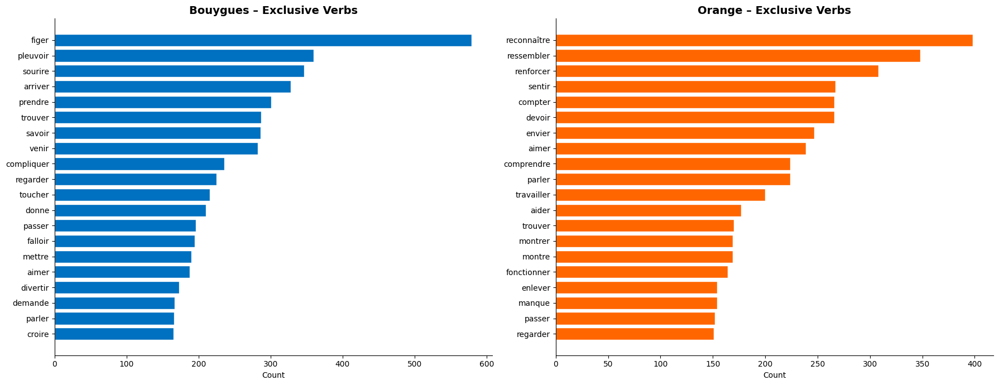

In [82]:
bouygues_excl = Counter()
orange_excl = Counter()

for _, row in df.iterrows():
    sb = set(row["verbs_bouygues_full"])
    so = set(row["verbs_orange_full"])
    for v in sb - so: bouygues_excl[v] += 1
    for v in so - sb: orange_excl[v] += 1

top_be = pd.DataFrame(bouygues_excl.most_common(20), columns=["verb", "count"])
top_oe = pd.DataFrame(orange_excl.most_common(20), columns=["verb", "count"])

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, data, color, title in [
    (axes[0], top_be, "#0070C0", "Bouygues – Exclusive Verbs"),
    (axes[1], top_oe, "#FF6600", "Orange – Exclusive Verbs"),
]:
    ax.barh(data["verb"][::-1], data["count"][::-1], color=color, edgecolor="white")
    ax.set_title(title, fontsize=14, fontweight="bold")
    ax.set_xlabel("Count")
    ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.savefig("exclusive_verbs.png", dpi=150, bbox_inches="tight")
plt.show()


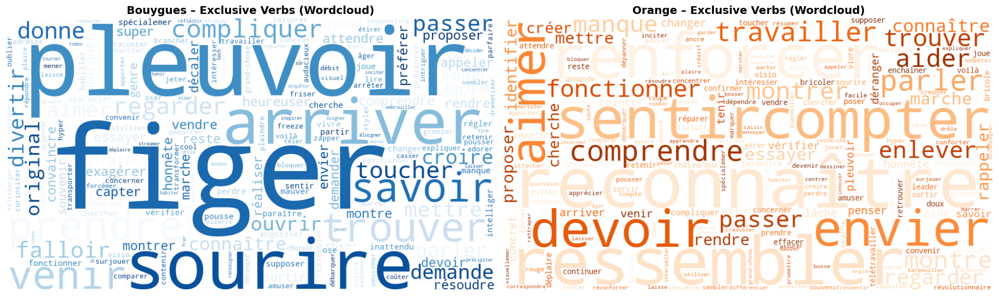

In [83]:
from wordcloud import WordCloud

# --- Wordclouds for exclusive verbs ---

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Bouygues
wc_b = WordCloud(
    width=900,
    height=500,
    background_color="white",
    colormap="Blues",
    max_words=200
).generate_from_frequencies(bouygues_excl)

axes[0].imshow(wc_b, interpolation="bilinear")
axes[0].axis("off")
axes[0].set_title("Bouygues – Exclusive Verbs (Wordcloud)", fontsize=14, fontweight="bold")

# Orange
wc_o = WordCloud(
    width=900,
    height=500,
    background_color="white",
    colormap="Oranges",
    max_words=200
).generate_from_frequencies(orange_excl)

axes[1].imshow(wc_o, interpolation="bilinear")
axes[1].axis("off")
axes[1].set_title("Orange – Exclusive Verbs (Wordcloud)", fontsize=14, fontweight="bold")

plt.tight_layout()

plt.savefig(
    "exclusive_verbs_wordcloud.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

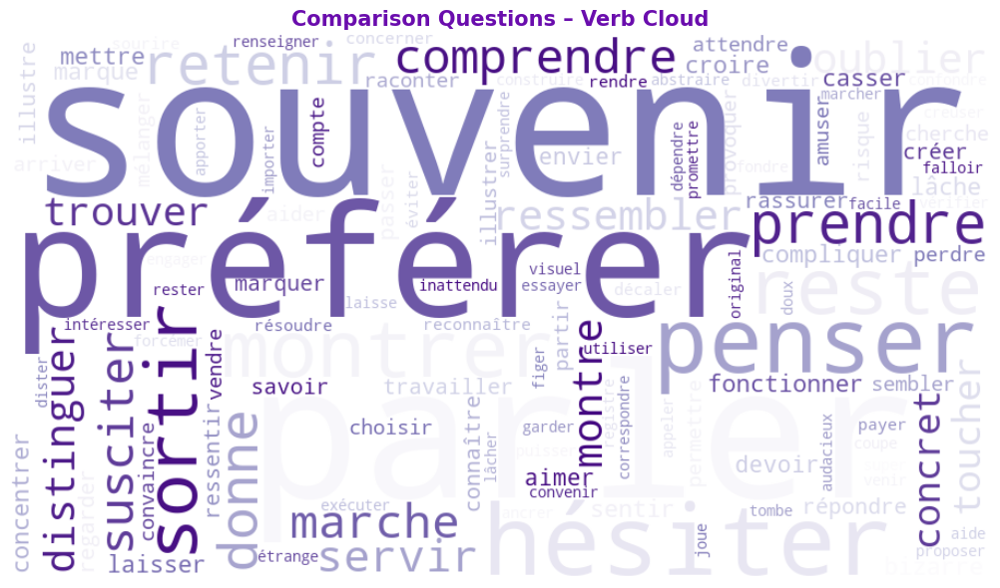

In [84]:
comp_vfreq = Counter([v for col in COMP_COLS for lst in df[col + "_verbs"] for v in lst])

fig, ax = plt.subplots(figsize=(12, 6))
ax.imshow(make_wc(comp_vfreq, "Purples"), interpolation="bilinear")
ax.set_title("Comparison Questions – Verb Cloud", fontsize=15, fontweight="bold", color="#6A0DAD")
ax.axis("off")
plt.tight_layout()
plt.savefig("verb_cloud_comparaison.png", dpi=150, bbox_inches="tight")
plt.show()
